<a href="https://colab.research.google.com/github/xAn-x/Vision-Lab/blob/master/02_Convolutional_AutoEncoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# %pip install lightning -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 811.0/811.0 kB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 869.5/869.5 kB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 32.6 MB/s eta 0:00:00


In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import lightning as L

import matplotlib.pyplot as plt

In [4]:
DEVICE='cuda' if torch.cuda.is_available() else 'cpu'

In [5]:
# import mnist
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import v2 as T

In [6]:
tfms=T.Compose([
  T.ToImage(),
  T.ToDtype(torch.float32),
  T.Lambda(lambda x: x/255.)
])

train_ds=datasets.MNIST("./data/mnist",train=True,transform=tfms,download=True)
valid_ds=datasets.MNIST("./data/mnist",train=False,transform=tfms,download=False)

len(train_ds),len(valid_ds)

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9912422/9912422 [00:00<00:00, 17397362.03it/s]


Extracting ./data/mnist/MNIST/raw/train-images-idx3-ubyte.gz to ./data/mnist/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28881/28881 [00:00<00:00, 526651.74it/s]


Extracting ./data/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/mnist/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1648877/1648877 [00:00<00:00, 3895561.38it/s]


Extracting ./data/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/mnist/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4542/4542 [00:00<00:00, 7092527.46it/s]

Extracting ./data/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/mnist/MNIST/raw



(60000, 10000)

In [7]:
img,label=train_ds[0]

img.shape,img.dtype

(torch.Size([1, 28, 28]), torch.float32)

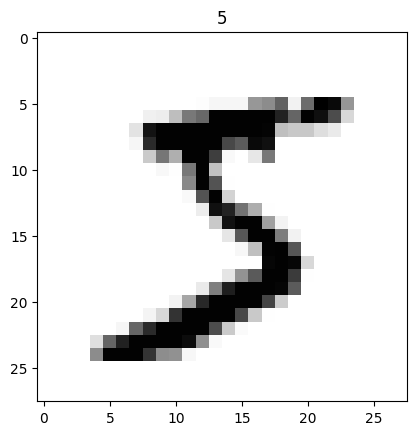

In [8]:
plt.imshow(img.permute(1,2,0),cmap='Greys')
plt.title(str(label))
plt.show()

In [9]:
train_dl=DataLoader(train_ds,batch_size=64,shuffle=True,num_workers=2,pin_memory=True)
valid_dl=DataLoader(train_ds,batch_size=128,shuffle=False,num_workers=2,pin_memory=True)

len(train_dl),len(valid_dl)

(938, 469)

In [23]:
from torchvision.utils import make_grid
import matplotlib.pyplot  as plt

def show_images(images:torch.Tensor,title=''):
  nrows=images.shape[0]//8
  grid=make_grid(images,nrow=nrows)
  grid=grid.permute(1,2,0)
  plt.imshow(grid)
  if title:
    plt.title(title)
  plt.show()

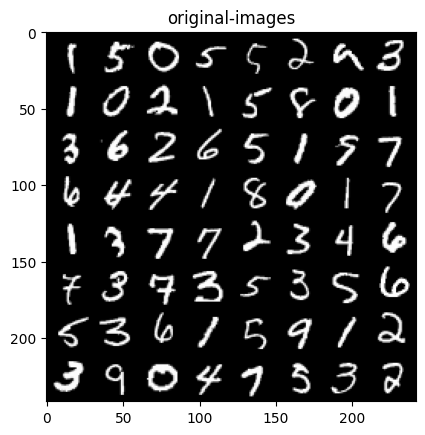

In [24]:
for images,_ in train_dl:
  show_images(images,'original-images')
  break

In [12]:
DEVICE='cuda' if torch.cuda.is_available() else 'cpu'

In [43]:
from torchvision.utils import make_grid


class ConvBlock(nn.Module):
  def __init__(self,out_channels,kernel_size,**kwargs):
    super().__init__()
    self.conv_block=nn.Sequential(
        nn.LazyConv2d(out_channels,kernel_size,**kwargs),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(inplace=True),
        nn.Dropout2d(0.2)
    )

  def forward(self,x):
    return self.conv_block(x)


class DeConvBlock(nn.Module):
  def __init__(self,out_channels,kernel_size,**kwargs):
    super().__init__()
    self.deconv_block=nn.Sequential(
        nn.LazyConvTranspose2d(out_channels,kernel_size,**kwargs),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(inplace=True),
        nn.Dropout2d(0.2)
    )

  def forward(self,x):
    return self.deconv_block(x)

class Reshape(nn.Module):
  def __init__(self,shape):
    super().__init__()
    self.shape=shape

  def forward(self,x):
    return x.reshape(self.shape)

class ConvAutoEncoder(L.LightningModule):
  def __init__(self):
    super().__init__()
    self.encoder=nn.Sequential(
        ConvBlock(8,7,padding='same'),

        ConvBlock(64,3,padding='same'),
        nn.MaxPool2d(2,2),# 14

        ConvBlock(128,3,padding='same'),
        nn.MaxPool2d(2,2),# 7

        ConvBlock(64,1,padding='same'),
        ConvBlock(64,3,padding='same'),
        nn.MaxPool2d(2,2),# 3

        ConvBlock(64,1,padding='same'),
        nn.Flatten(),
        nn.LazyLinear(8),
    )

    self.decoder=nn.Sequential(
        nn.LazyLinear(64*7*7),
        Reshape((-1,64,7,7)),

        DeConvBlock(64,3),
        DeConvBlock(128,3),
        nn.Upsample(scale_factor=2,mode='nearest'),

        DeConvBlock(64,1),
        DeConvBlock(64,3),
        nn.Upsample(scale_factor=2,mode='nearest'),
        DeConvBlock(1,1),

        nn.AdaptiveAvgPool2d((28,28)),
        # nn.Sigmoid()
    )

    self.training_step_outputs=[]
    self.validation_step_outputs=[]

  def forward(self,X):
    X=self.encoder(X)
    X=self.decoder(X)
    return X

  def configure_optimizers(self):
    return torch.optim.AdamW(self.parameters(),lr=1e-3)

  def common_step(self,batch,batch_idx):
    X,_=batch
    gen_X=self(X)
    loss=F.mse_loss(gen_X,X)
    return loss

  def training_step(self,batch,batch_idx):
    loss=self.common_step(batch,batch_idx)
    self.training_step_outputs.append(loss.detach().item())
    self.log("Train_Loss_Per_Batch",loss)
    return loss

  def validation_step(self,batch,batch_idx):
    if batch_idx==0:
      with torch.no_grad():
        X,_=batch
        gen_X=self(X)
        nrow=X.shape[0]//8
        images=make_grid(gen_X,nrow=nrow)
        self.logger.experiment.add_image("generated_images",images,self.current_epoch)

    loss=self.common_step(batch,batch_idx)
    self.validation_step_outputs.append(loss.detach().item())
    self.log("Validation_Loss_Per_Batch",loss)
    return loss

  def on_train_epoch_end(self):
    avg_loss=torch.mean(torch.tensor(self.training_step_outputs)).item()
    self.log("Train_Loss_Per_Epoch",avg_loss)
    print(f"training-loss:{avg_loss:.4f}\n\n")
    self.training_step_outputs.clear()

  def on_validation_epoch_end(self):
    avg_loss=torch.mean(torch.tensor(self.validation_step_outputs)).item()
    self.log("Validation_Loss_Per_Epoch",avg_loss)
    print(f"validation-loss:{avg_loss:.4f}")
    self.validation_step_outputs.clear()

  def predict_step(self,batch,batch_idx):
    X,_=batch
    gen_X=self(X)
    return gen_X


In [44]:
model=ConvAutoEncoder().to(DEVICE)
model

ConvAutoEncoder(
  (encoder): Sequential(
    (0): ConvBlock(
      (conv_block): Sequential(
        (0): LazyConv2d(0, 8, kernel_size=(7, 7), stride=(1, 1), padding=same)
        (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01, inplace=True)
        (3): Dropout2d(p=0.2, inplace=False)
      )
    )
    (1): ConvBlock(
      (conv_block): Sequential(
        (0): LazyConv2d(0, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01, inplace=True)
        (3): Dropout2d(p=0.2, inplace=False)
      )
    )
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): ConvBlock(
      (conv_block): Sequential(
        (0): LazyConv2d(0, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affi

In [29]:
temp=torch.randn(2,1,28,28).to(DEVICE)
model(temp).shape

torch.Size([2, 1, 28, 28])

In [30]:
from torchsummary import summary
summary(model,(1,28,28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 28, 28]             400
       BatchNorm2d-2            [-1, 8, 28, 28]              16
         LeakyReLU-3            [-1, 8, 28, 28]               0
         Dropout2d-4            [-1, 8, 28, 28]               0
         ConvBlock-5            [-1, 8, 28, 28]               0
            Conv2d-6           [-1, 64, 28, 28]           4,672
       BatchNorm2d-7           [-1, 64, 28, 28]             128
         LeakyReLU-8           [-1, 64, 28, 28]               0
         Dropout2d-9           [-1, 64, 28, 28]               0
        ConvBlock-10           [-1, 64, 28, 28]               0
        MaxPool2d-11           [-1, 64, 14, 14]               0
           Conv2d-12          [-1, 128, 14, 14]          73,856
      BatchNorm2d-13          [-1, 128, 14, 14]             256
        LeakyReLU-14          [-1, 128,

In [31]:
print("Encoder:")
summary(model.encoder,(1,28,28))
print("\nDecoder:")
summary(model.decoder,(8,))

Encoder:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 28, 28]             400
       BatchNorm2d-2            [-1, 8, 28, 28]              16
         LeakyReLU-3            [-1, 8, 28, 28]               0
         Dropout2d-4            [-1, 8, 28, 28]               0
         ConvBlock-5            [-1, 8, 28, 28]               0
            Conv2d-6           [-1, 64, 28, 28]           4,672
       BatchNorm2d-7           [-1, 64, 28, 28]             128
         LeakyReLU-8           [-1, 64, 28, 28]               0
         Dropout2d-9           [-1, 64, 28, 28]               0
        ConvBlock-10           [-1, 64, 28, 28]               0
        MaxPool2d-11           [-1, 64, 14, 14]               0
           Conv2d-12          [-1, 128, 14, 14]          73,856
      BatchNorm2d-13          [-1, 128, 14, 14]             256
        LeakyReLU-14          

In [18]:
# import shutil
# shutil.rmtree("lightning_logs")

In [49]:
from lightning import Trainer
from lightning.pytorch.loggers import TensorBoardLogger

logger=TensorBoardLogger(".")
DEVICE='cuda' if torch.cuda.is_available() else 'cpu'
epochs=10

trainer=Trainer(accelerator=DEVICE,devices='auto',logger=logger,fast_dev_run=False,max_epochs=epochs,enable_progress_bar=True)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [50]:
trainer.fit(model,train_dl,valid_dl)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type       | Params | Mode 
-----------------------------------------------
0 | encoder | Sequential | 133 K  | train
1 | decoder | Sequential | 184 K  | train
-----------------------------------------------
318 K     Trainable params
0         Non-trainable params
318 K     Total params
1.274     Total estimated model params size (MB)
78        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type       | Params | Mode 
-----------------------------------------------
0 | encoder | Sequential | 133 K  | train
1 | decoder | Sequential | 184 K  | train
-----------------------------------------------
318 K     Trainable params
0         Non-trainable params
318 K     Total params
1.274     Total estimated model params size (MB)
78        Modules in train mode
0         Modul

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.1111


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0307
training-loss:0.0595




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0275
training-loss:0.0453




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0254
training-loss:0.0435




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0251
training-loss:0.0423




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0236
training-loss:0.0415




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0221
training-loss:0.0409




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0220
training-loss:0.0406




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0220
training-loss:0.0403




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0220
training-loss:0.0399




Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


validation-loss:0.0211
training-loss:0.0396




In [21]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs/

<IPython.core.display.Javascript object>

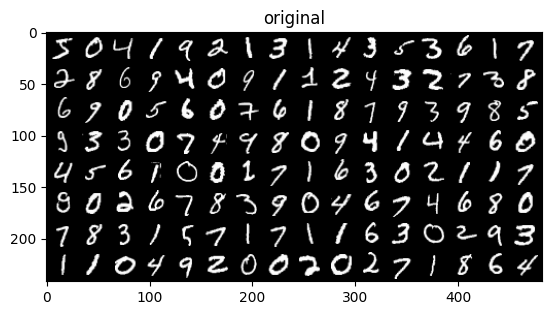

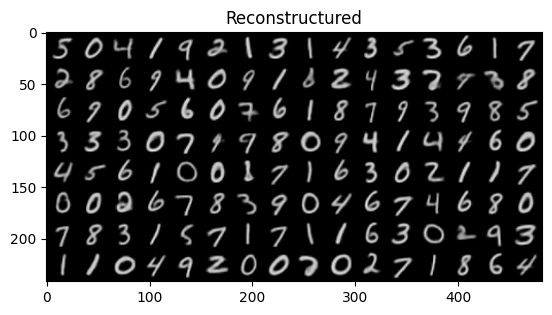

In [51]:
with torch.no_grad():
  model.eval()
  device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  for images,_ in valid_dl:
    images=images.to(device)
    gen_images=model(images).to(device)
    gen_images=gen_images.detach().to('cpu').clip(0,1)
    show_images(images,"original")
    show_images(gen_images,"Reconstructured")
    break
  model.train()